In [1]:
from IPython.display import display, HTML, Image
display(HTML("<style>.container { width:95% !important; }</style>"))

%load_ext autoreload
%autoreload 2

import warnings
warnings.filterwarnings("ignore")

import os
import copy

import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
from anndata import AnnData

import matplotlib
from matplotlib import cm
import matplotlib.pyplot as plt
import matplotlib.patheffects as path_effects

import sys
sys.path.append("../../lib")
from stpalette import palette_WM4007_rna, palette_WM4237_rna
from plots import plotSpatialAll, plotSpatialEdge
from cheatmap import sMED, cdist, pdist
from utils import loadAdImage, filterCNV

In [2]:
model = 'WM4237'
palette_rna = palette_WM4007_rna if model=='WM4007' else palette_WM4237_rna

In [3]:
preprocessedStDataPath = 'd:/from HPCC 11 28 2022/results_NF1-nod-t2t-k35/%s/' % model
dataPath = '../../data/'
ids = sorted(np.loadtxt(dataPath + 'ids_%s_ST.txt' % model, dtype=str))
sids = [id[7:12] for id in ids]
ids

['WM4237_T0_S1_ST',
 'WM4237_T0_S2_ST',
 'WM4237_T1_S1_ST',
 'WM4237_T1_S2_ST',
 'WM4237_T2_S1_ST',
 'WM4237_T2_S2_ST',
 'WM4237_T3_S1_ST',
 'WM4237_T3_S2_ST',
 'WM4237_T4_S1_ST',
 'WM4237_T4_S2_ST',
 'WM4237_TC_S1_ST',
 'WM4237_TC_S2_ST',
 'WM4237_TE_S1_ST',
 'WM4237_TE_S2_ST',
 'WM4237_TE_S3_ST',
 'WM4237_TE_S4_ST']

In [4]:
ad_cnv = sc.read(dataPath + 'ad_all_human_clustered_cnv_%s.h5ad' % model)
ad_cnv

AnnData object with n_obs × n_vars = 18397 × 8897
    obs: 'sample', 'cluster', 'time', 'original_barcode', 'id', 'cnv_clusters'
    uns: 'cluster_colors', 'cnv_clusters_colors', 'leiden', 'neighbors', 'pca', 'sample_colors', 'time_colors', 'umap'
    obsm: 'X_palantir', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [98]:
use_raw_distances = False
metric = 'cosine'

if use_raw_distances:
    df_cnv = ad_cnv.to_df()
    df_cnv.index = ad_cnv.obs['cnv_clusters']
else:
    df_cnv = pd.DataFrame(ad_cnv.obsm['X_pca'], index=ad_cnv.obs['cnv_clusters'])
    
uclusters = list(ad_cnv.obs['cnv_clusters'].unique())

res = dict()
for c1 in uclusters:
    for c2 in uclusters:
        if (c1!=c2) and (not (c1, c2) in res.keys()) and (not (c2, c1) in res.keys()):
            print(c1, '\t', c2, '\t', df_cnv.loc[c1].shape[0], df_cnv.loc[c2].shape[0])
            d = cdist(df_cnv.loc[c1], df_cnv.loc[c2], metric=metric).mean() # euclidean cosine
            res.update({(c1, c2): d})
df_pdist = pd.Series(res).unstack()
df_ppdist = df_pdist.reindex(uclusters).T.reindex(uclusters).fillna(0.) + df_pdist.reindex(uclusters).T.reindex(uclusters).T.fillna(0.)
df_ppdist

0 	 9 	 3623 637
0 	 1 	 3623 2962
0 	 6 	 3623 997
0 	 3 	 3623 2472
0 	 10 	 3623 425
0 	 7 	 3623 758
0 	 2 	 3623 2504
0 	 5 	 3623 1237
0 	 4 	 3623 1898
0 	 8 	 3623 704
0 	 11 	 3623 180
9 	 1 	 637 2962
9 	 6 	 637 997
9 	 3 	 637 2472
9 	 10 	 637 425
9 	 7 	 637 758
9 	 2 	 637 2504
9 	 5 	 637 1237
9 	 4 	 637 1898
9 	 8 	 637 704
9 	 11 	 637 180
1 	 6 	 2962 997
1 	 3 	 2962 2472
1 	 10 	 2962 425
1 	 7 	 2962 758
1 	 2 	 2962 2504
1 	 5 	 2962 1237
1 	 4 	 2962 1898
1 	 8 	 2962 704
1 	 11 	 2962 180
6 	 3 	 997 2472
6 	 10 	 997 425
6 	 7 	 997 758
6 	 2 	 997 2504
6 	 5 	 997 1237
6 	 4 	 997 1898
6 	 8 	 997 704
6 	 11 	 997 180
3 	 10 	 2472 425
3 	 7 	 2472 758
3 	 2 	 2472 2504
3 	 5 	 2472 1237
3 	 4 	 2472 1898
3 	 8 	 2472 704
3 	 11 	 2472 180
10 	 7 	 425 758
10 	 2 	 425 2504
10 	 5 	 425 1237
10 	 4 	 425 1898
10 	 8 	 425 704
10 	 11 	 425 180
7 	 2 	 758 2504
7 	 5 	 758 1237
7 	 4 	 758 1898
7 	 8 	 758 704
7 	 11 	 758 180
2 	 5 	 2504 1237
2 	 4 	 2504 1

,0,9,1,6,3,10,7,2,5,4,8,11
0,0.000000,0.891851,0.857111,0.896540,1.101418,0.897537,0.996900,0.959971,1.290050,1.114178,1.227739,1.226123
9,0.891851,0.000000,0.945825,0.964639,1.079311,0.959816,1.014332,1.002430,1.143930,1.007968,1.074092,1.096865
1,0.857111,0.945825,0.000000,0.941078,1.036529,0.919146,1.005420,0.952676,1.164214,1.114106,1.164941,1.143676
6,0.896540,0.964639,0.941078,0.000000,1.032421,0.973621,0.916495,0.984979,1.146762,1.078634,1.124140,1.096411
3,1.101418,1.079311,1.036529,1.032421,0.000000,1.053808,0.981335,0.975003,0.859903,1.051182,0.943128,0.919463
10,0.897537,0.959816,0.919146,0.973621,1.053808,0.000000,1.050801,0.954328,1.109777,1.118410,1.148602,1.089247
7,0.996900,1.014332,1.005420,0.916495,0.981335,1.050801,0.000000,1.008388,1.026213,1.032293,1.041269,1.038335
2,0.959971,1.002430,0.952676,0.984979,0.975003,0.954328,1.008388,0.000000,1.028220,1.095249,1.087881,1.041690
5,1.290050,1.143930,1.164214,1.146762,0.859903,1.109777,1.026213,1.028220,0.000000,0.889789,0.769441,0.726182
4,1.114178,1.007968,1.114106,1.078634,1.051182,1.118410,1.032293,1.095249,0.889789,0.000000,0.807840,0.936406


In [100]:
df_styled = df_ppdist.style.background_gradient(axis=None, vmin=df_ppdist[df_ppdist!=0].min().min(), cmap='bwr')
df_styled.to_excel(f'{model}_PCA_cosine_distance_average_over_cnv_clusters.xlsx')
df_styled

,0,9,1,6,3,10,7,2,5,4,8,11
0,0.000000,0.891851,0.857111,0.896540,1.101418,0.897537,0.996900,0.959971,1.290050,1.114178,1.227739,1.226123
9,0.891851,0.000000,0.945825,0.964639,1.079311,0.959816,1.014332,1.002430,1.143930,1.007968,1.074092,1.096865
1,0.857111,0.945825,0.000000,0.941078,1.036529,0.919146,1.005420,0.952676,1.164214,1.114106,1.164941,1.143676
6,0.896540,0.964639,0.941078,0.000000,1.032421,0.973621,0.916495,0.984979,1.146762,1.078634,1.124140,1.096411
3,1.101418,1.079311,1.036529,1.032421,0.000000,1.053808,0.981335,0.975003,0.859903,1.051182,0.943128,0.919463
10,0.897537,0.959816,0.919146,0.973621,1.053808,0.000000,1.050801,0.954328,1.109777,1.118410,1.148602,1.089247
7,0.996900,1.014332,1.005420,0.916495,0.981335,1.050801,0.000000,1.008388,1.026213,1.032293,1.041269,1.038335
2,0.959971,1.002430,0.952676,0.984979,0.975003,0.954328,1.008388,0.000000,1.028220,1.095249,1.087881,1.041690
5,1.290050,1.143930,1.164214,1.146762,0.859903,1.109777,1.026213,1.028220,0.000000,0.889789,0.769441,0.726182
4,1.114178,1.007968,1.114106,1.078634,1.051182,1.118410,1.032293,1.095249,0.889789,0.000000,0.807840,0.936406


# Load images and create ADs

In [7]:
images = {id: [(ad_temp := sc.read(preprocessedStDataPath + '%s/st_adata_processed.h5ad' % id)).uns['spatial'], ad_temp.obs.index, ad_temp.obsm['spatial']] for id in ids}

In [8]:
ads = dict()
for sample in ids:
    print(sample, end='\t')
    ads[sample] = ad_cnv[ad_cnv.obs['id']==sample, :].copy()    
    ads[sample].uns['spatial'] = images[sample][0]
    ads[sample].obsm['spatial'] = pd.DataFrame(index=images[sample][1], data=images[sample][2]).reindex(ads[sample].obs['original_barcode']).values
    ads[sample][:, :] = filterCNV(ads[sample].to_df().T, n=10).T

WM4237_T0_S1_ST	WM4237_T0_S2_ST	WM4237_T1_S1_ST	WM4237_T1_S2_ST	WM4237_T2_S1_ST	WM4237_T2_S2_ST	WM4237_T3_S1_ST	WM4237_T3_S2_ST	WM4237_T4_S1_ST	WM4237_T4_S2_ST	WM4237_TC_S1_ST	WM4237_TC_S2_ST	WM4237_TE_S1_ST	WM4237_TE_S2_ST	WM4237_TE_S3_ST	WM4237_TE_S4_ST	

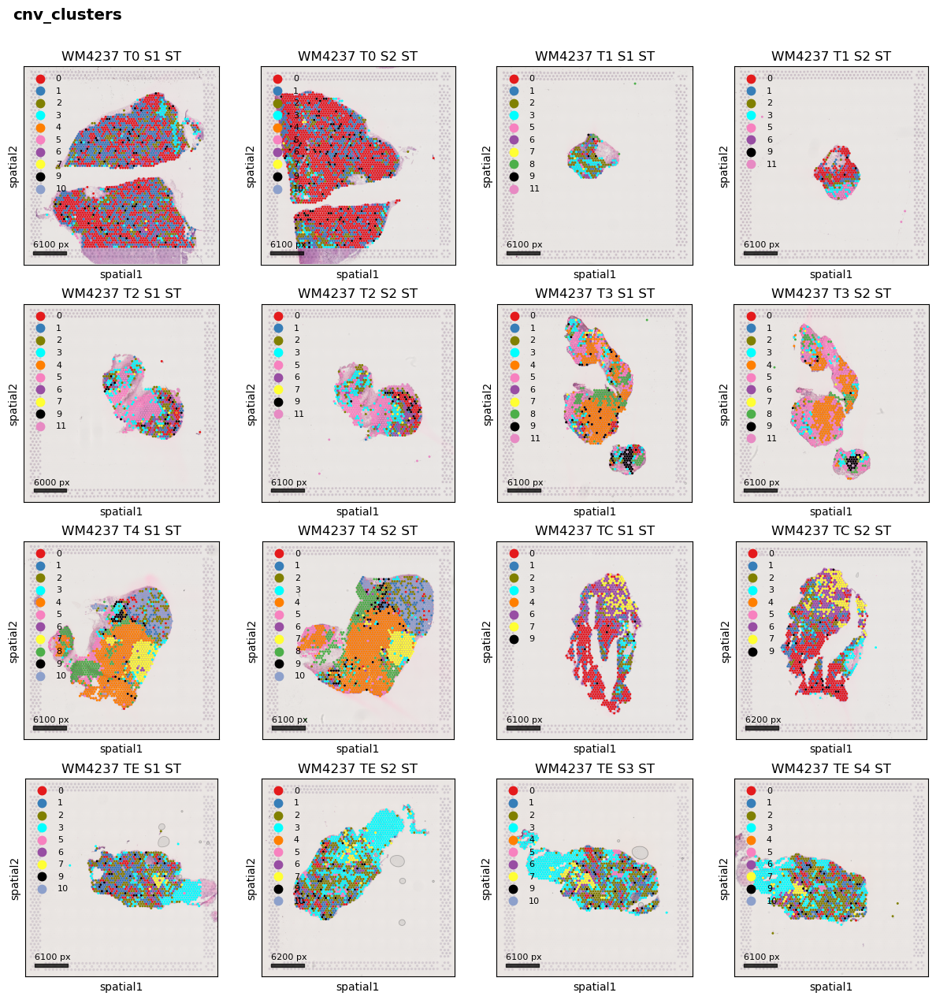

In [9]:
plotSpatialAll(ads, identity='cnv_clusters', palette=palette_rna, f=0.75)

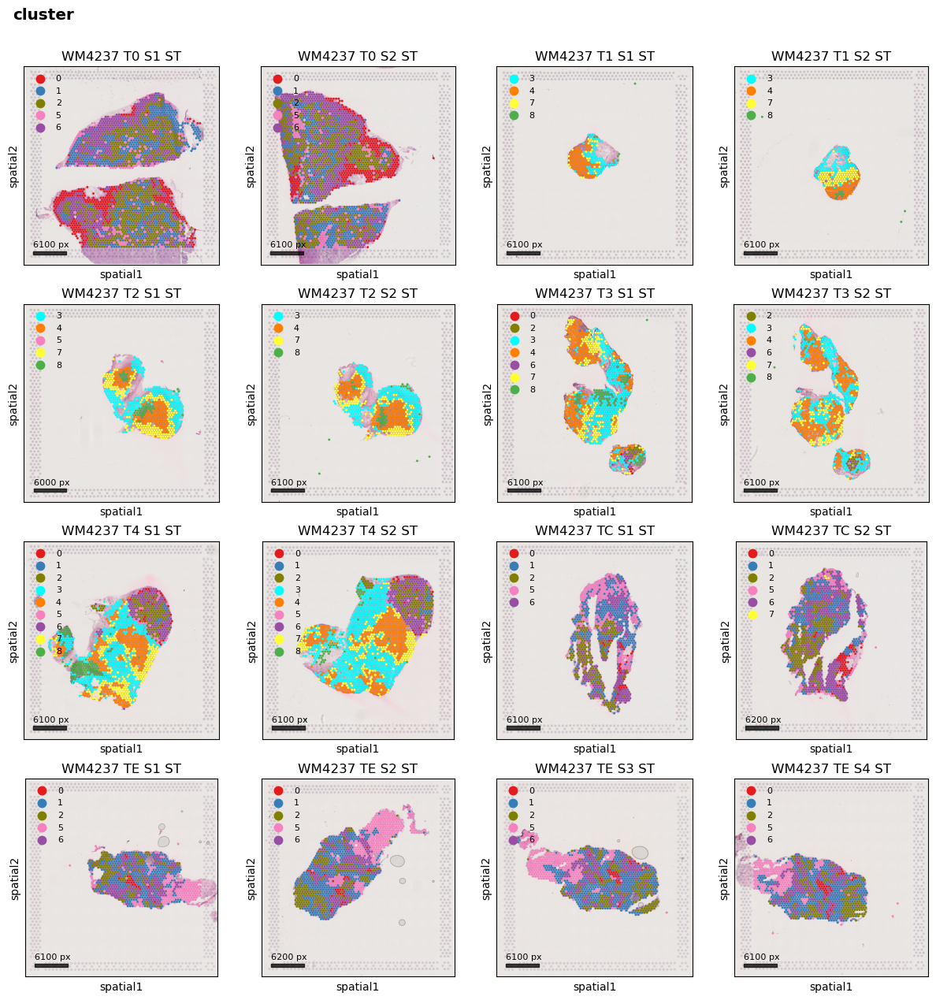

In [12]:
plotSpatialAll(ads, identity='cluster', palette=palette_rna, f=0.75)

In [13]:
params = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=1, absolute_cutoff=60., R=1,
              alpha_quantile=0.75, method='cosine', key_added='cnv_cosine_distance', cacheEdges=True, useSavedCache=False) # MED, pearson, euclidean

plotSpatialEdge(ads, identity='cluster', palette=palette_rna, f=0.2, invert=False, use_raw_distances=False, noplot=True, **params)

WM4237_T0_S1_ST	WM4237_T0_S2_ST	WM4237_T1_S1_ST	WM4237_T1_S2_ST	WM4237_T2_S1_ST	WM4237_T2_S2_ST	WM4237_T3_S1_ST	WM4237_T3_S2_ST	WM4237_T4_S1_ST	WM4237_T4_S2_ST	WM4237_TC_S1_ST	WM4237_TC_S2_ST	WM4237_TE_S1_ST	WM4237_TE_S2_ST	WM4237_TE_S3_ST	WM4237_TE_S4_ST	

In [ ]:
plotSpatialAll({id: ads[id] for id in ids if not '_TE_' in id}, identity='cnv_cosine_distance', palette=palette_rna, f=0.6, cmap='nipy_spectral', uniformColorScale=True, wspace=0.3)

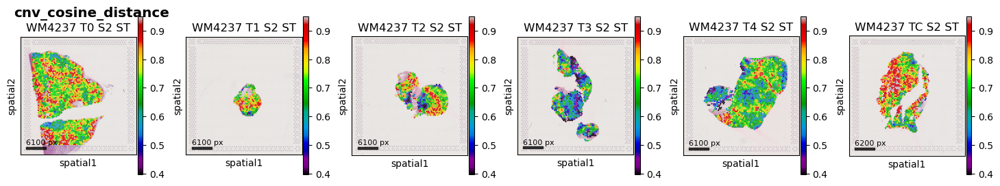

In [15]:
plotSpatialAll({id: ads[id] for id in ids if not '_TE_' in id and '_S2_' in id}, identity='cnv_cosine_distance', palette=palette_rna, nx=6, f=0.6, cmap='nipy_spectral', uniformColorScale=True, wspace=0.3)

In [ ]:
# ad_all = sc.read(dataPath + 'ad_all_human_clustered_st_%s.h5ad' % model)
# images = {id: [(ad_temp := sc.read(preprocessedStDataPath + '%s/st_adata_processed.h5ad' % id)).uns['spatial'], ad_temp.obs.index, ad_temp.obsm['spatial']] for id in ids}
# ads_rna = dict()
# for sample in ids:
#     ads_rna[sample] = ad_all[ad_all.obs['sample']==sample, :].copy()    
#     ads_rna[sample].uns['spatial'] = images[sample][0]
#     ads_rna[sample].obsm['spatial'] = pd.DataFrame(index=images[sample][1], data=images[sample][2]).reindex(ads_rna[sample].obs['original_barcode']).values
    
# ad = ads_rna['WM4237_T4_S1_ST'][(ads_rna['WM4237_T4_S1_ST'].obs['array_col'] >= 65) & (ads_rna['WM4237_T4_S1_ST'].obs['array_col'] <= 79) & 
#                                 (ads_rna['WM4237_T4_S1_ST'].obs['array_row'] >= 25) & (ads_rna['WM4237_T4_S1_ST'].obs['array_row'] <= 32)]
# sc.pl.spatial(ad, color=['cluster'], cmap='gist_ncar', palette=palette_rna)

KeyError: 'CNV Burden'

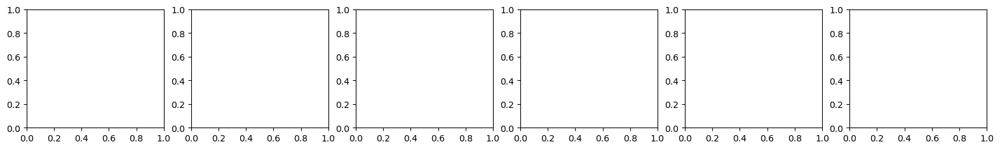

In [20]:
plotSpatialAll({id: ads[id] for id in ['WM4237_T0_S2_ST', 'WM4237_T1_S2_ST', 'WM4237_T2_S2_ST', 'WM4237_T3_S2_ST', 'WM4237_T4_S2_ST', 'WM4237_TC_S2_ST']}, identity='CNV Burden', fy=0.75, cmap=None, nx=6, f=0.65)

WM4237_T0_S1_ST	WM4237_T0_S2_ST	WM4237_T1_S1_ST	WM4237_T1_S2_ST	WM4237_T2_S1_ST	WM4237_T2_S2_ST	WM4237_T3_S1_ST	WM4237_T3_S2_ST	WM4237_T4_S1_ST	WM4237_T4_S2_ST	WM4237_TC_S1_ST	WM4237_TC_S2_ST	

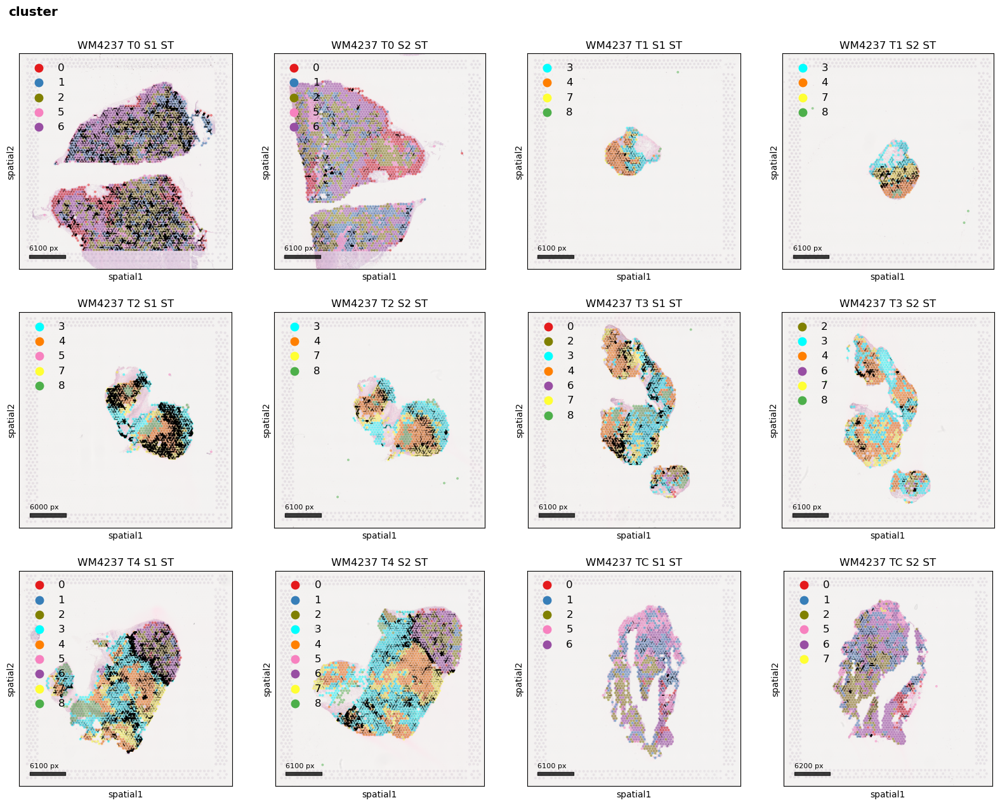

In [18]:
params = dict(fontsize=12, markerscale=1.5, linewidth_factor=2.0, alpha=0.5, alpha_img=0.5, decay_power=4, absolute_cutoff=0.9, R=1, # 20
              alpha_quantile=0.75, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge({id: ads[id] for id in ids if not '_TE_' in id}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)
# res=plotSpatialEdge({(id:='WM4237_T4_S1_ST'): ads['WM4237_T4_S1_ST']}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)

WM4237_T0_S1_ST	WM4237_T0_S2_ST	WM4237_T1_S1_ST	WM4237_T1_S2_ST	WM4237_T2_S1_ST	WM4237_T2_S2_ST	WM4237_T3_S1_ST	WM4237_T3_S2_ST	WM4237_T4_S1_ST	WM4237_T4_S2_ST	WM4237_TC_S1_ST	WM4237_TC_S2_ST	

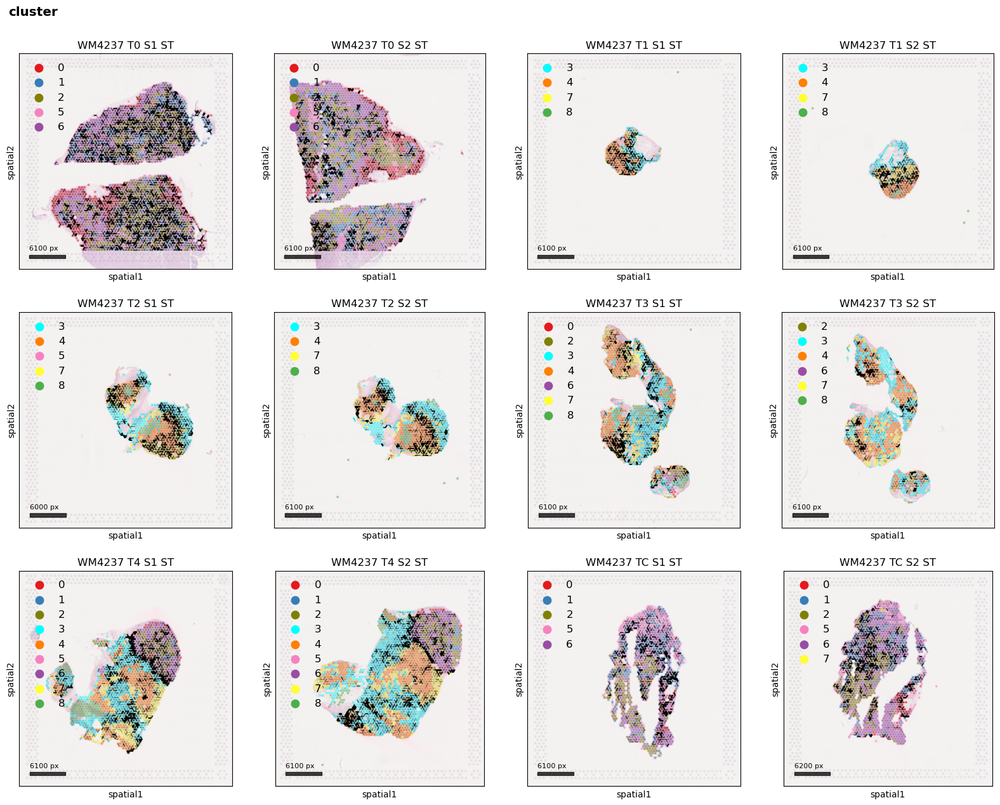

In [16]:
params = dict(fontsize=12, markerscale=1.5, linewidth_factor=2.0, alpha=0.5, alpha_img=0.5, decay_power=4, absolute_cutoff=None, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

res=plotSpatialEdge({id: ads[id] for id in ids if not '_TE_' in id}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)
# res=plotSpatialEdge({(id:='WM4237_T4_S1_ST'): ads['WM4237_T4_S1_ST']}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)

In [ ]:
params = dict(fontsize=12, markerscale=1.5, linewidth_factor=2.0, alpha=0.5, alpha_img=0.5, decay_power=4, absolute_cutoff=None, R=1, # 20
              alpha_quantile=0.99, method='cosine', cacheEdges=False, useSavedCache=False)

# res=plotSpatialEdge({id: ads[id] for id in ids if not '_TE_' in id}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)
res=plotSpatialEdge({(id:='WM4237_T4_S1_ST'): ads['WM4237_T4_S1_ST']}, identity='cluster', palette=palette_rna, f=1.0, invert=False, use_raw_distances=False, noplot=False, **params)

In [172]:
se_burden = pd.read_csv(dataPath + 'CNV_burden_WM4237.csv', index_col=0)['CNV burden'] # CNV burden	CNV burden amplifications	CNV burden deletions

In [174]:
ads['WM4237_T4_S1_ST'].obs['CNV burden'] = se_burden.loc[ads['WM4237_T4_S1_ST'].obs.index]

In [187]:
ad.obs[['array_row', 'array_col', 'cluster']].sort_values(by=['array_row', 'array_col'])

,array_row,array_col,cluster
ATGCATGATCCAGGAT-1-WM4237_T4_S1_ST,25,65,3
GATTCCCTTGTCGCAG-1-WM4237_T4_S1_ST,25,67,3
ACTCAATAAAGGCACG-1-WM4237_T4_S1_ST,25,69,7
TAAGGCAACATAAGAT-1-WM4237_T4_S1_ST,25,71,6
GGTTTACAATCTCAAT-1-WM4237_T4_S1_ST,25,73,6
ATAACGGAGTCCAACG-1-WM4237_T4_S1_ST,25,75,5
GACAACGACCATTGAA-1-WM4237_T4_S1_ST,25,77,2
AGTACGGGCACCTGGC-1-WM4237_T4_S1_ST,25,79,0
CATGGTCTAGATACCG-1-WM4237_T4_S1_ST,26,66,3
CTAGTTGGGCCCGGTA-1-WM4237_T4_S1_ST,26,68,3


In [389]:
a = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='ATGCATGATCCAGGAT-1-WM4237_T4_S1_ST')[0]]
b = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='GATTCCCTTGTCGCAG-1-WM4237_T4_S1_ST')[0]]
c = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='ACTCAATAAAGGCACG-1-WM4237_T4_S1_ST')[0]]
d = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='TAAGGCAACATAAGAT-1-WM4237_T4_S1_ST')[0]]
e = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='GGTTTACAATCTCAAT-1-WM4237_T4_S1_ST')[0]]

f = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='AGCACCAGTACTCACG-1-WM4237_T4_S1_ST')[0]]
g = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='TCTACCGTCCACAAGC-1-WM4237_T4_S1_ST')[0]]

g2 = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='TCTTCGATACCAATAA-1-WM4237_T4_S1_ST')[0]]
g3 = ads['WM4237_T4_S1_ST'].obsm['X_pca'][np.where(ads['WM4237_T4_S1_ST'].obs.index=='TCTTGATGCGTAGCGA-1-WM4237_T4_S1_ST')[0]]


In [205]:
np.sqrt(((a - b)**2).sum())

40.867622

In [206]:
np.sqrt(((b - c)**2).sum()), np.sqrt(((a - c)**2).sum())

(48.973686, 48.240215)

In [209]:
np.sqrt(((d - e)**2).sum()), np.sqrt(((a - d)**2).sum()), np.sqrt(((a - e)**2).sum())

(38.479515, 56.073864, 54.25596)

In [387]:
np.sqrt(((f - g)**2).sum())

53.99672

In [390]:
np.sqrt(((g2 - g3)**2).sum())

49.18845

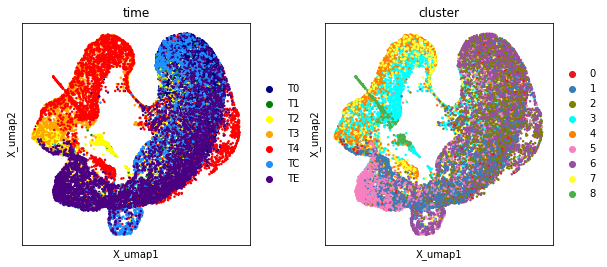

In [45]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.embedding(ad_cnv, color=['time', 'cluster'], basis="X_umap", palette=palette_rna, size=25)
sc.pl.embedding(ad_cnv, color=['time', 'cluster'], basis="X_umap", palette=palette_rna, size=25)

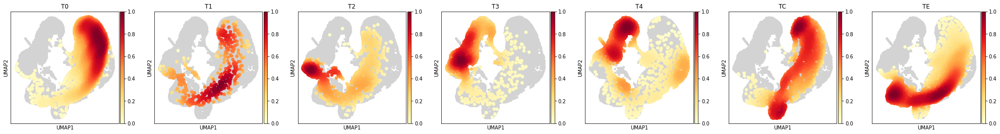

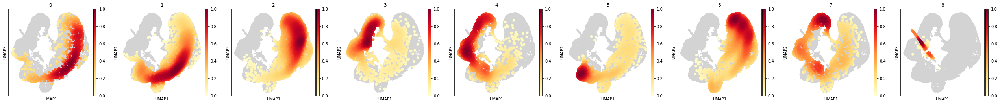

In [60]:
identity = 'time'
sc.tl.embedding_density(ad_cnv, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_cnv, groupby=identity, ncols=10)

identity = 'cluster'
sc.tl.embedding_density(ad_cnv, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_cnv, groupby=identity, ncols=10)

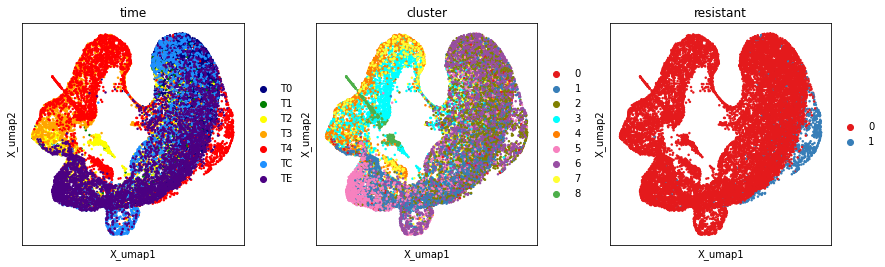

In [63]:
ad_cnv.obs['resistant'] = ((ad_cnv.obs['cluster'].isin(['0', '1', '2', '5', '6'])) & (ad_cnv.obs['time'].isin(['T4']))).astype(int).astype(str).astype('category')
sc.pl.embedding(ad_cnv, color=['time', 'cluster', 'resistant'], basis="X_umap", palette=palette_rna, size=25)

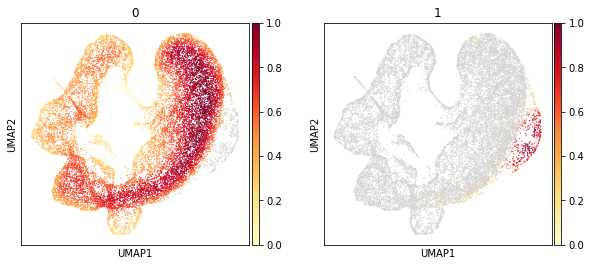

In [67]:
identity = 'resistant'
sc.tl.embedding_density(ad_cnv, basis='umap', groupby=identity)
sc.pl.embedding_density(ad_cnv, groupby=identity, ncols=10, s=5)

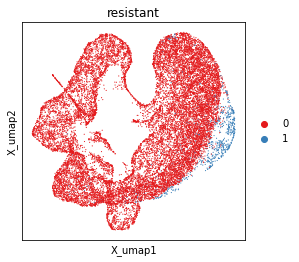

In [68]:
sc.pl.embedding(ad_cnv, color=['resistant'], basis="X_umap", palette=palette_rna, size=5)

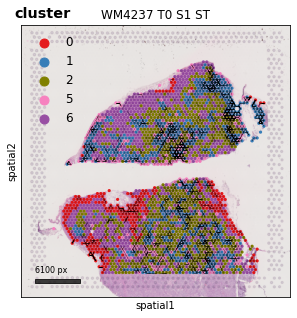

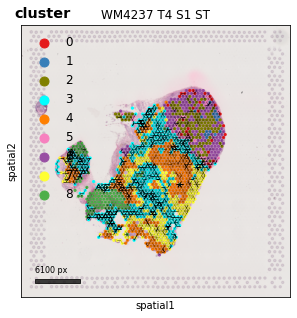

In [109]:
params2 = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=2, absolute_cutoff=80, alpha_quantile=0.75, method='MED', cacheEdges=False)

plotSpatialEdge({(id:='WM4237_T0_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=1, invert=False, **params2)
plotSpatialEdge({(id:='WM4237_T4_S1_ST'): ads[id]}, identity='cluster', palette=palette_rna, f=1, invert=False, **params2)

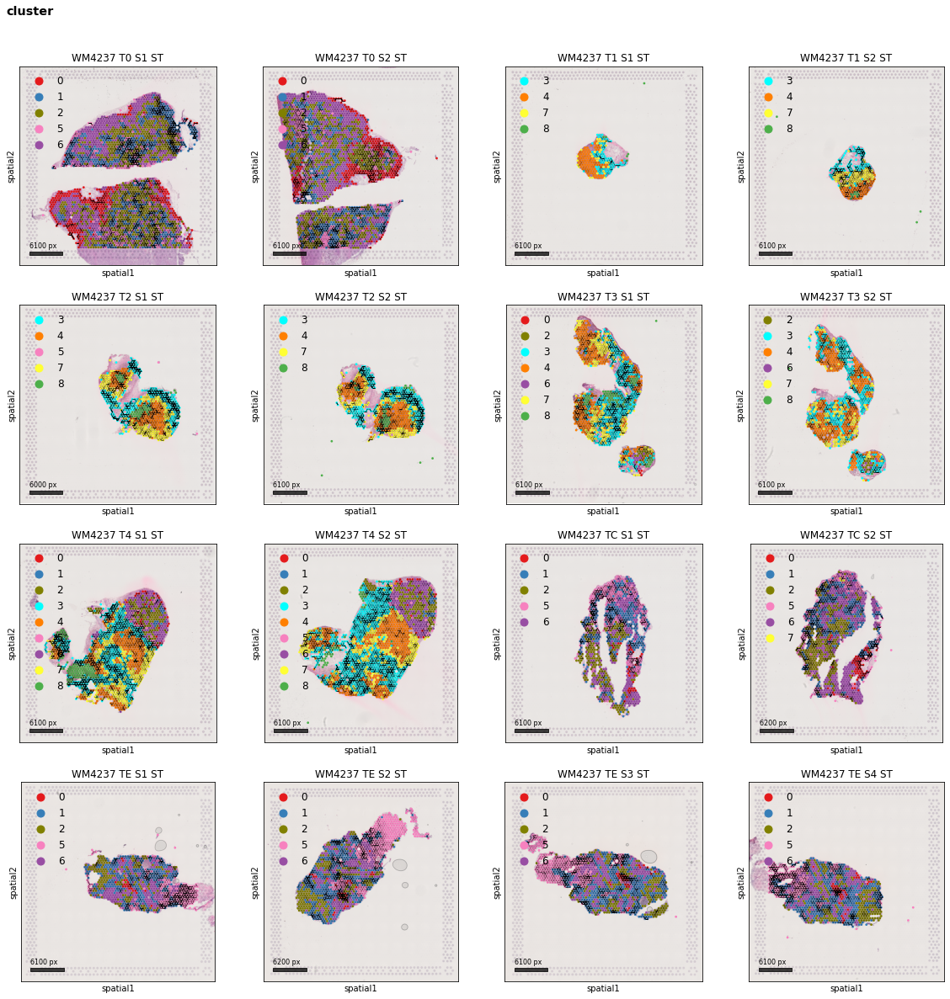

In [110]:
plotSpatialEdge(ads, identity='cluster', palette=palette_rna, f=1., invert=False, **params2)

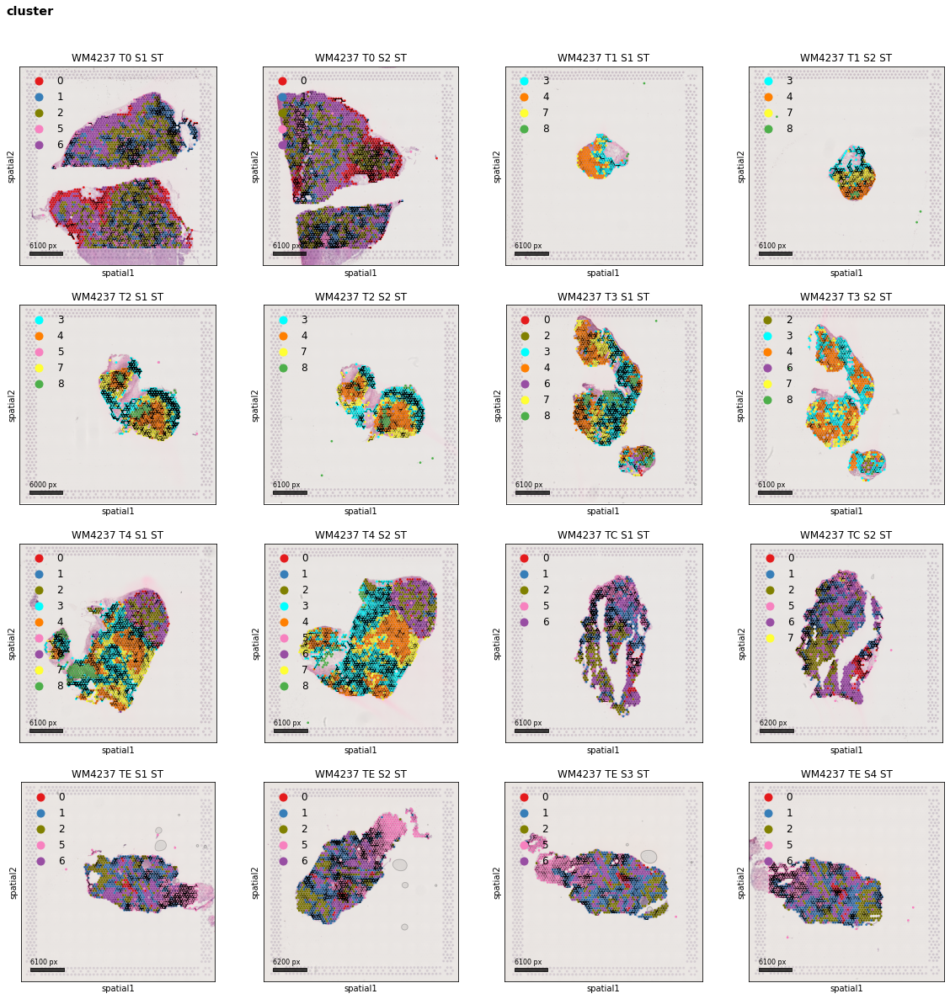

In [111]:
params = dict(fontsize=12, markerscale=1.5, linewidth_factor=1.0, alpha=1.0, alpha_img=1.0, decay_power=2, absolute_cutoff=80, alpha_quantile=0.75, method='MED', cacheEdges=True) # MED, pearson, kendall, spearman

plotSpatialEdge(ads, identity='cluster', palette=palette_rna, f=1., invert=False, **params)